# Mask R-CNN - Inspect Leaf Trained Model 
Code and visualizations to test, debug, and evaluate the Mask R-CNN model

## 1.  Preparation
### 1.1 Import package 

In [1]:
# Import package 
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches      
from plantcv import plantcv as pcv 

In [2]:
# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

import Leaf
%matplotlib inline 

Using TensorFlow backend.


In [3]:
# Directory to save logs and trained model
LOGS_DIR = os.path.join(ROOT_DIR, "logs")
# Dataset directory
dataset_dir = os.path.join(ROOT_DIR, "dataset")

### 1.2 Configurations 

In [4]:
# using and show parameters in Inference Configuration
config = Leaf.LeavesInferenceConfig()

config.display()



Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
Batch_size                     2
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.8
DETECTION_NMS_THRESHOLD        0.48
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                2.0
IMAGE_RESIZE_MODE              pad64
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE         

## 2. Notebook Preferences 

In [5]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0
# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# Only inference mode is supported right now
TEST_MODE = "inference"   #???

In [6]:
def get_ax(rows=1, cols=1, size=16):   #???
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    fig, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    fig.tight_layout()
    return ax

## 3. Load 
### 3.1 Validation Dataset 

In [7]:
# Generate Image IDs
Image_IDs = []
for (root, dirs, filenames) in os.walk(dataset_dir):
    for x in filenames:
        if x.endswith('rgb.png'):
            Image_IDs.append(x)
num_images = len(Image_IDs)

In [8]:
# Helper function to load leaves and mask 
class LeavesDataset(utils.Dataset):
    """Load the synthetic arabidopsis dataset. 
    Different image from dataset has different name. In this load_leaves function, we assume 
    image name is like format of 'plant00000_rgb.png' and corresponding mask is like 
    'plant00000_label.png'. The image_id generated by function gen_IDs is like 'plant00000'. 
    """
    
    def load_leaves(self, dataset_dir, Image_IDs):
        """Load a subset of the leaf dataset. 
        
        dataset_dir: Root direcotry of the dataset 
        Image_IDs: A list that includes all the images to load 
        """
        # Add classes. We only have one class to add---leaves 
        # Naming the dataset 'leaves'
        self.add_class('leaves', 1, 'leaves')
        
        # Add images 
        for image_id in Image_IDs:
            self.add_image(
                    'leaves',
                    image_id = image_id,
                    path = os.path.join(dataset_dir, image_id)) ##
            
    def load_mask(self, image_id):
        '''
        Generate masks for each instance of the given image 
        Input: the image_id, the index number of given image in the Image_IDs_(train, val, test)
        Output: 
        masks: A bool array of shape [height, width, instance count] with
        one mask per instance. 
        class_ids: a 1D array of class IDs of the instance masks. Here we only have 
        one class, leave and class_id = 1. 
        '''
        info = self.image_info[image_id]
        mask_id = '{}_label.png'.format(info['id'][0:10])

        instance_masks = []

        # Set debug to 'print' instead of None
        pcv.params.debug = 'print'

        # Use a pre-v3 function to open a image 
        # Note that pcv.params.debug is passed to the debug argument
        # read the mask file for the given image
        masks_img, masks_path, masks_filename = pcv.readimage(os.path.join(dataset_dir, mask_id))  ## path? 
        # Find the pixel value for each mask
        uniq_rgb = np.unique(masks_img.reshape(-1, masks_img.shape[2]), axis=0) 
        ## remove the instance of background, whose pixel value is [0, 0, 0]
        uniq_rgb = np.delete(uniq_rgb, 0, 0) 
        for rgb in uniq_rgb:
            # Generate a mask for each instance with positive area = 255 
            # negative area = 0 
            mask = np.zeros(np.shape(masks_img)[:2], dtype=np.uint8)
            mask[np.all(masks_img == rgb, axis=-1)] = 255
            # Transfer the mask to bool mask. Positive area = True 
            # Negative area = False
            mask = mask.astype(np.bool)
            instance_masks.append(mask)
        instance_masks = np.stack(instance_masks, axis=-1)
        return instance_masks, np.ones(uniq_rgb.shape[0], dtype=np.int32)
        


In [9]:
# Load validation dataset
dataset = LeavesDataset()
dataset.load_leaves(dataset_dir, Image_IDs) #???
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 1
Classes: ['BG', 'leaves']


### 3.2 Load Model 

In [10]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference",
                              model_dir=LOGS_DIR,   #???
                              config=config)

Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.


In [12]:
# load the last model you trained
# weights_path = model.find_last()
weights_path = "../../mask_rcnn_leaves_0060.h5"

# Load weights

print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  ../../mask_rcnn_leaves_0060.h5


OSError: Unable to open file (truncated file: eof = 98910208, sblock->base_addr = 0, stored_eof = 257557808)

## 4. Run Detection 

In [12]:
image_id = random.choice(dataset.image_ids)


In [13]:
molded_image, image_meta, molded_gt_class_id, molded_gt_bbox, molded_gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)

In [14]:
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

image ID: leaves.plant11344_rgb.png (0) 
Original image shape:  [441 441   3]


## the model.detect_molded has bug here 

In [15]:
# Run object detection
results = model.detect_molded(np.expand_dims(molded_image, 0), np.expand_dims(image_meta, 0), verbose=1)

Processing 1 images
image                    shape: (896, 896, 3)         min:    0.00000  max:  199.00000  uint8
molded_images            shape: (1, 896, 896, 3)      min:    0.00000  max:  199.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  896.00000  float64
anchors                  shape: (1, 200508, 4)        min:   -0.10113  max:    1.02962  float32


In [16]:
# Display results
r = results[0]
log("gt_class_id", molded_gt_class_id)
log("gt_bbox", molded_gt_bbox)
log("gt_mask", molded_gt_mask)

gt_class_id              shape: (23,)                 min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (23, 4)               min:    7.00000  max:  889.00000  int32
gt_mask                  shape: (896, 896, 23)        min:    0.00000  max:    1.00000  bool


In [17]:
# Compute AP over range 0.5 to 0.95 and print it
utils.compute_ap_range(molded_gt_bbox, molded_gt_class_id, molded_gt_mask,
                       r['rois'], r['class_ids'], r['scores'], r['masks'],
                       verbose=1)

AP @0.50:	 0.230
AP @0.55:	 0.230
AP @0.60:	 0.118
AP @0.65:	 0.118
AP @0.70:	 0.118
AP @0.75:	 0.081
AP @0.80:	 0.081
AP @0.85:	 0.081
AP @0.90:	 0.006
AP @0.95:	 0.000
AP @0.50-0.95:	 0.106


0.10621118034635271

In [18]:
# Visualize ground truth and prediction together 
# visualize.display_differences(
#     image,
#     gt_bbox, gt_class_id, gt_mask,
#     r['rois'], r['class_ids'], r['scores'], r['masks'],
#     dataset.class_names, ax=get_ax(),
#     show_box=False, show_mask=False,
#     iou_threshold=0.5, score_threshold=0.5)

In [19]:
r['class_ids'].shape   #???*+9+
r['masks'].shape

(896, 896, 7)

In [20]:
print(config.DETECTION_NMS_THRESHOLD)

0.64


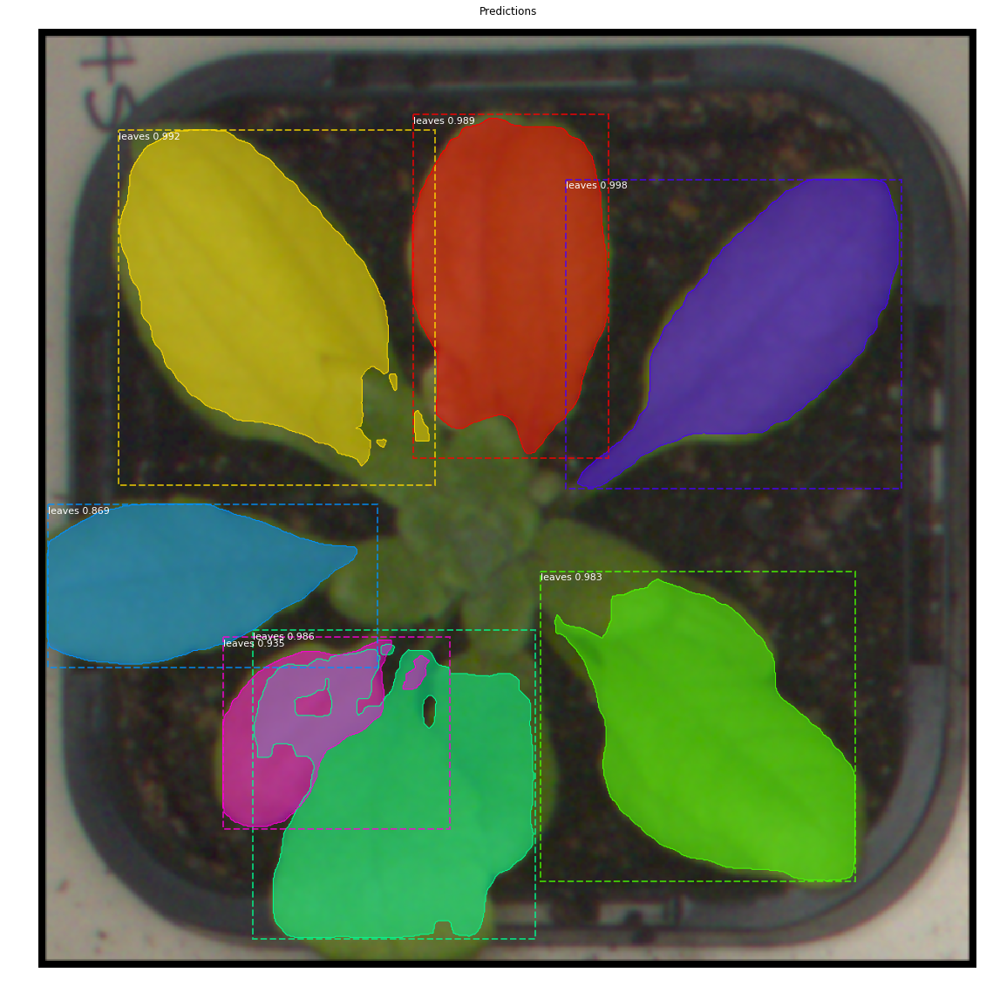

In [21]:
#Display predictions only
visualize.display_instances(molded_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=get_ax(1),
                            show_bbox=True, show_mask=True,
                            title="Predictions")

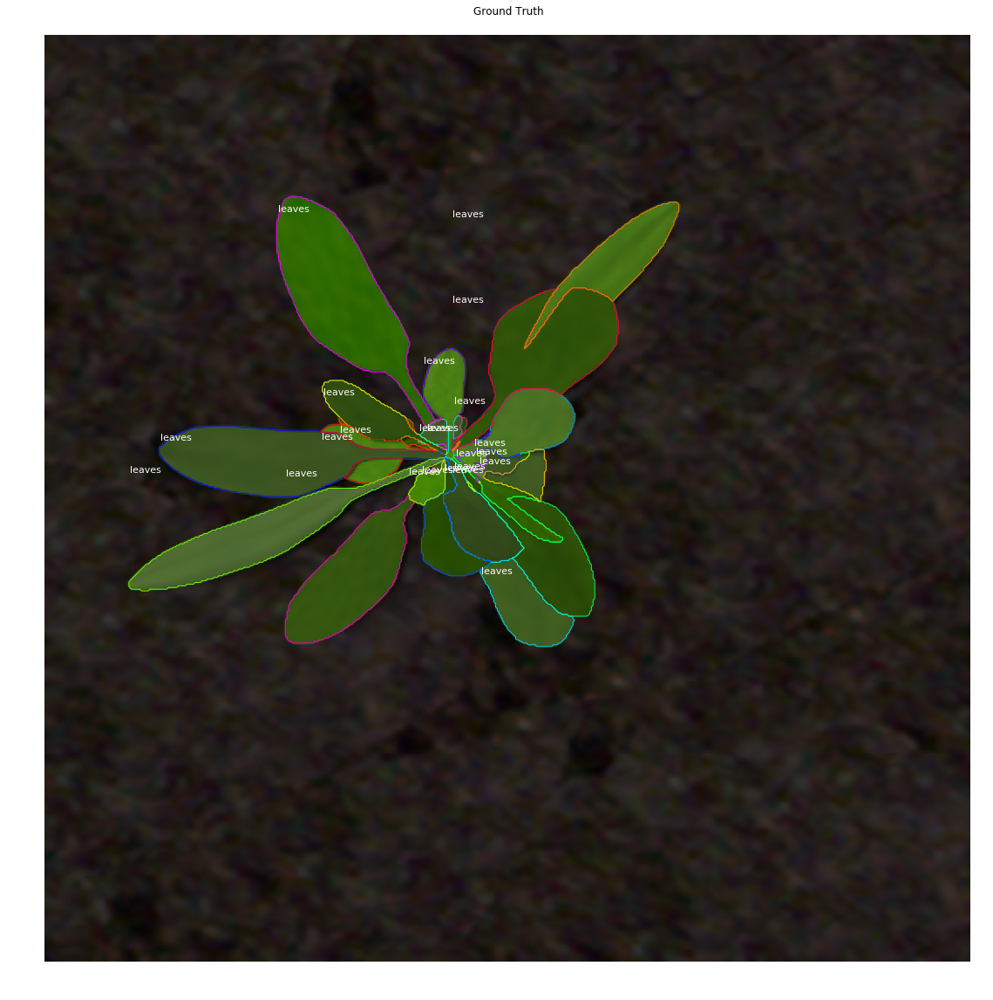

In [42]:
# Display Ground Truth only
visualize.display_instances(image, gt_bbox, gt_mask, gt_class_id, 
                            dataset.class_names, ax=get_ax(1),
                            show_bbox=False, show_mask=False,
                            title="Ground Truth")

In [49]:
def compute_batch_ap(dataset, image_ids, verbose=1):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect_molded(image[np.newaxis], image_meta[np.newaxis], verbose=0)
        # Compute AP over range 0.5 to 0.95
        r = results[0]
        ap = utils.compute_ap_range(
            gt_bbox, gt_class_id, gt_mask,
            r['rois'], r['class_ids'], r['scores'], r['masks'],
            verbose=0)
        APs.append(ap)
        if verbose:
            info = dataset.image_info[image_id]
            meta = modellib.parse_image_meta(image_meta[np.newaxis,...])
            print("{:3} {}   AP: {:.2f}".format(
                meta["image_id"][0], meta["original_image_shape"][0], ap))
    return APs

# Run on validation set
limit = 5
APs = compute_batch_ap(dataset, dataset.image_ids[:limit])
print("Mean AP overa {} images: {:.4f}".format(len(APs), np.mean(APs)))

  0 [550 550   3]   AP: 0.35
  1 [550 550   3]   AP: 0.47
  2 [550 550   3]   AP: 0.48
  3 [550 550   3]   AP: 0.59
  4 [550 550   3]   AP: 0.53
Mean AP overa 5 images: 0.4827


## 5. Step by Step Prediction 

### Stage 1: Region Proposal Network 
The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high objectness score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

#### 1.a.RPN Targets
The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.  
To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [50]:
# Get anchors and convert to pixel coordinates
anchors = model.get_anchors(image.shape)
anchors = utils.denorm_boxes(anchors, image.shape[:2])
log("anchors", anchors)

# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = anchors[positive_anchor_ix]
negative_anchors = anchors[negative_anchor_ix]
neutral_anchors = anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

anchors                  shape: (331452, 4)           min:  -91.00000  max: 1179.00000  int32
target_rpn_match         shape: (331452,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -5.93750  max:    7.11111  float64
positive_anchors         shape: (39, 4)               min:  165.00000  max:  768.00000  int32
negative_anchors         shape: (217, 4)              min:  -16.00000  max: 1152.00000  int32
neutral anchors          shape: (331196, 4)           min:  -91.00000  max: 1179.00000  int32
refined_anchors          shape: (39, 4)               min:  126.00000  max:  780.00000  float32


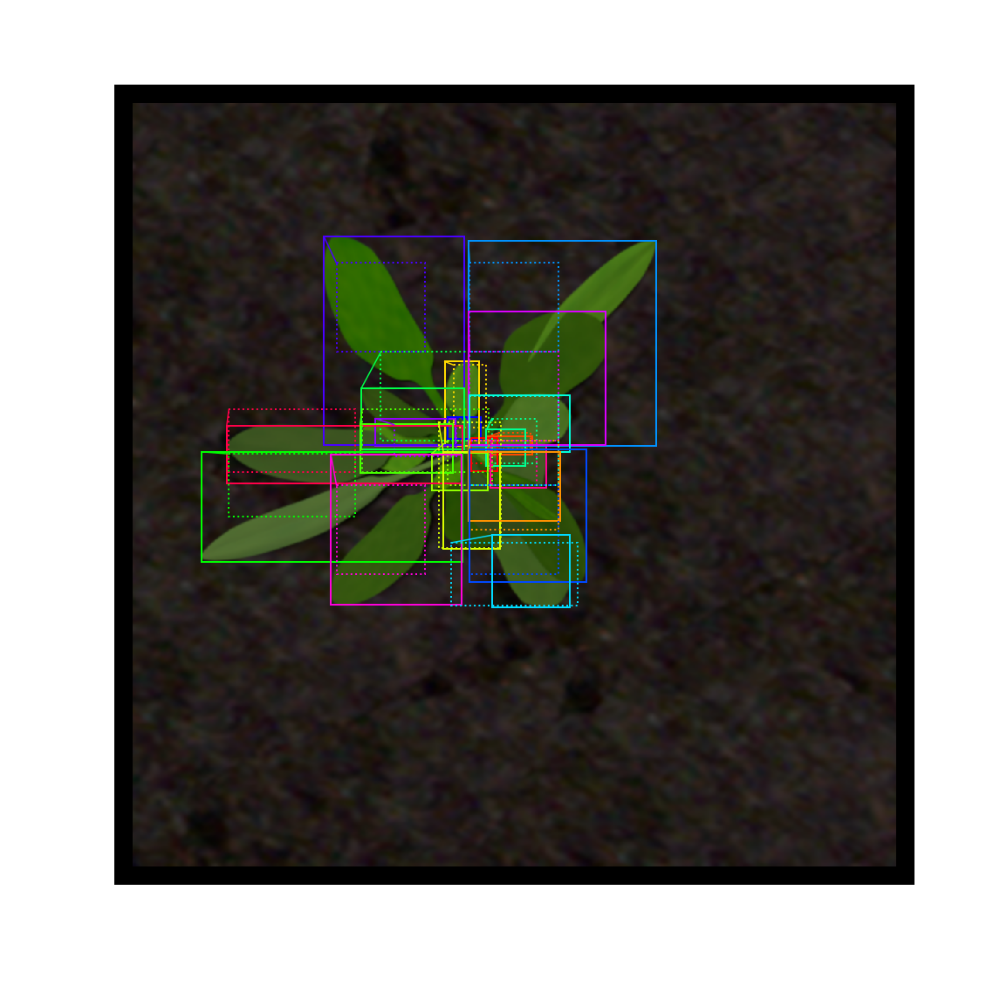

In [22]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(
    image, ax=get_ax(),
    boxes=positive_anchors,
    refined_boxes=refined_anchors)

## 1.b RPN Predictions
Here we run the RPN graph and display its predictions.

In [51]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph(image[np.newaxis], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
], image_metas=image_meta[np.newaxis])

rpn_class                shape: (1, 331452, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.07864  max:    1.02303  float32
refined_anchors          shape: (1, 6000, 4)          min:   -9.00745  max:    9.98725  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (1000,)               min:    0.00000  max: 1041.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


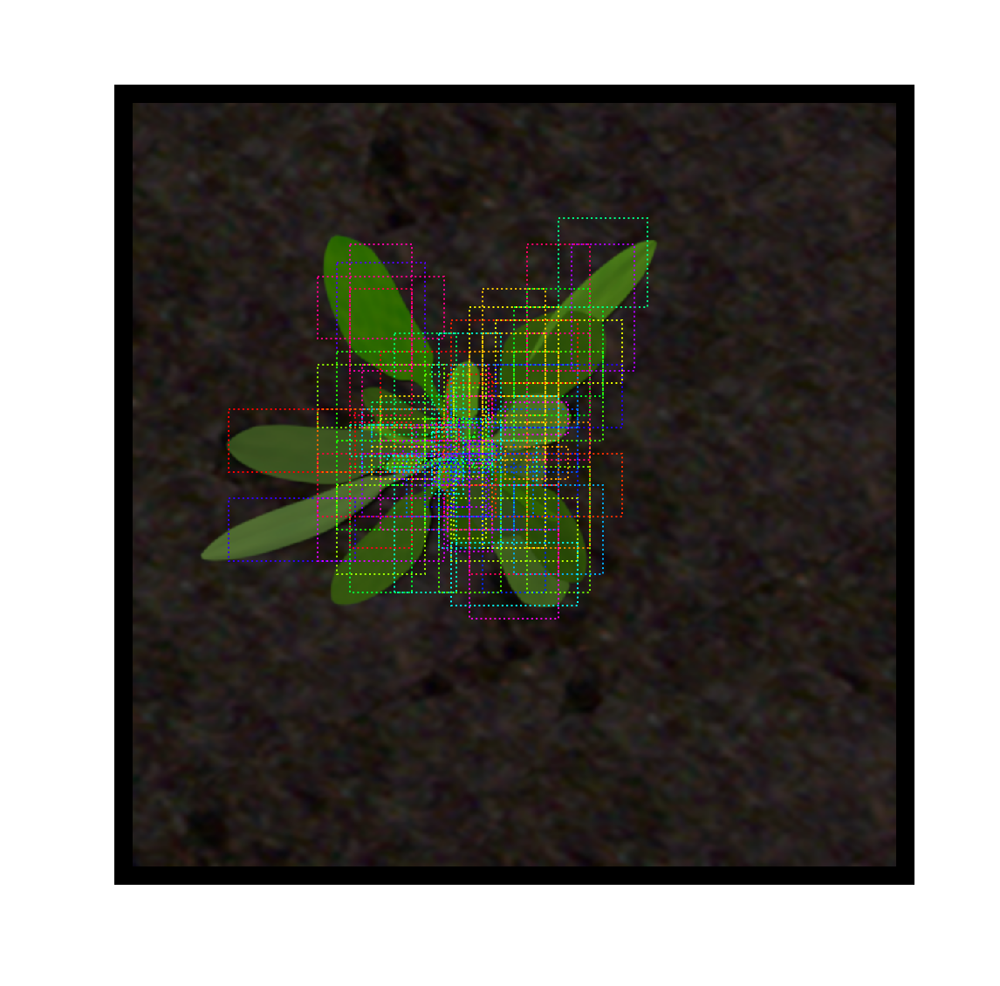

In [52]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=anchors[sorted_anchor_ids[:limit]], ax=get_ax())

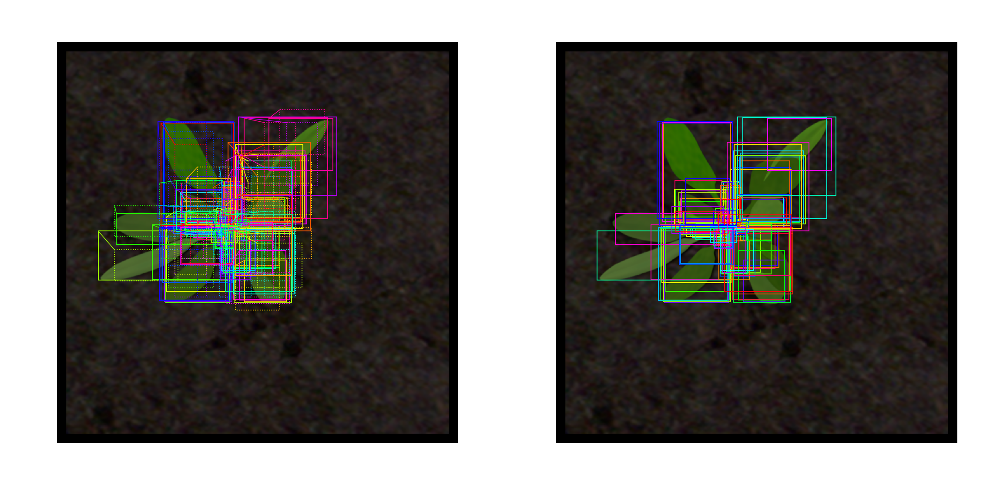

In [53]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 100
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

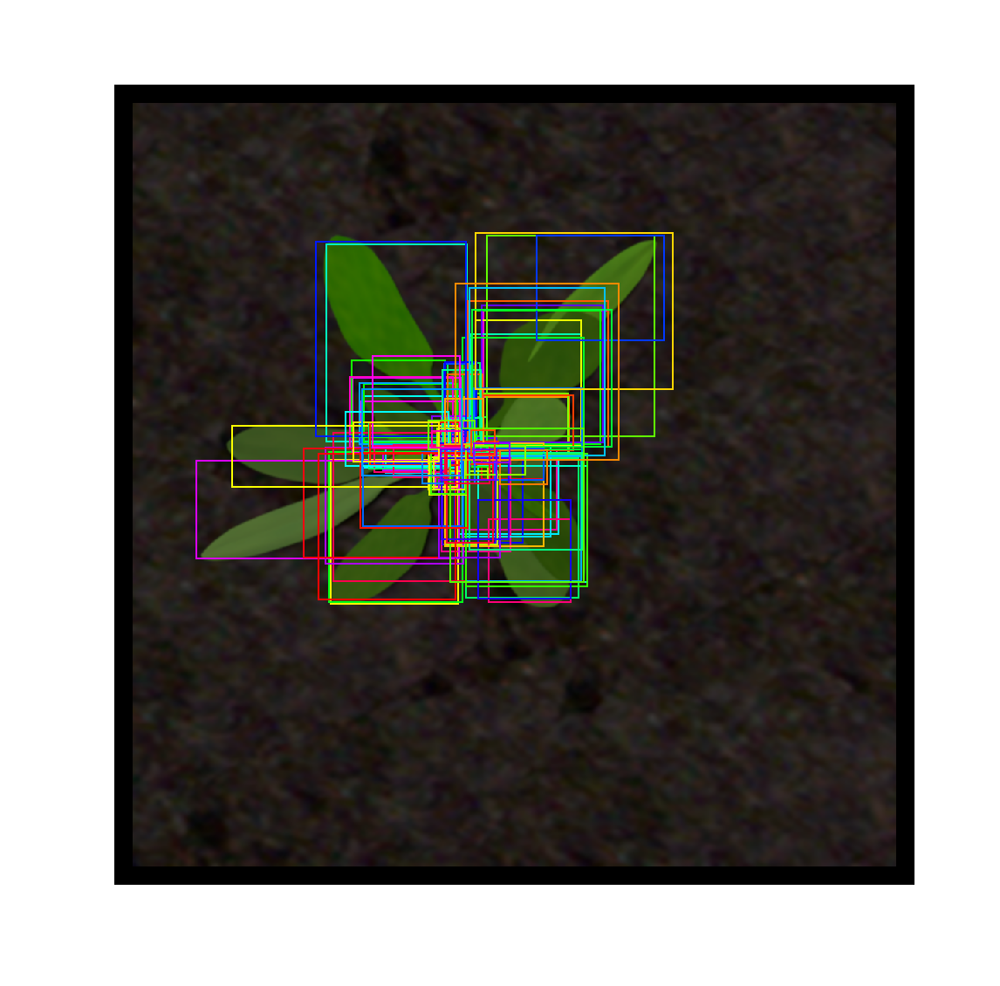

In [54]:
# Show refined anchors after non-max suppression
limit = 100
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

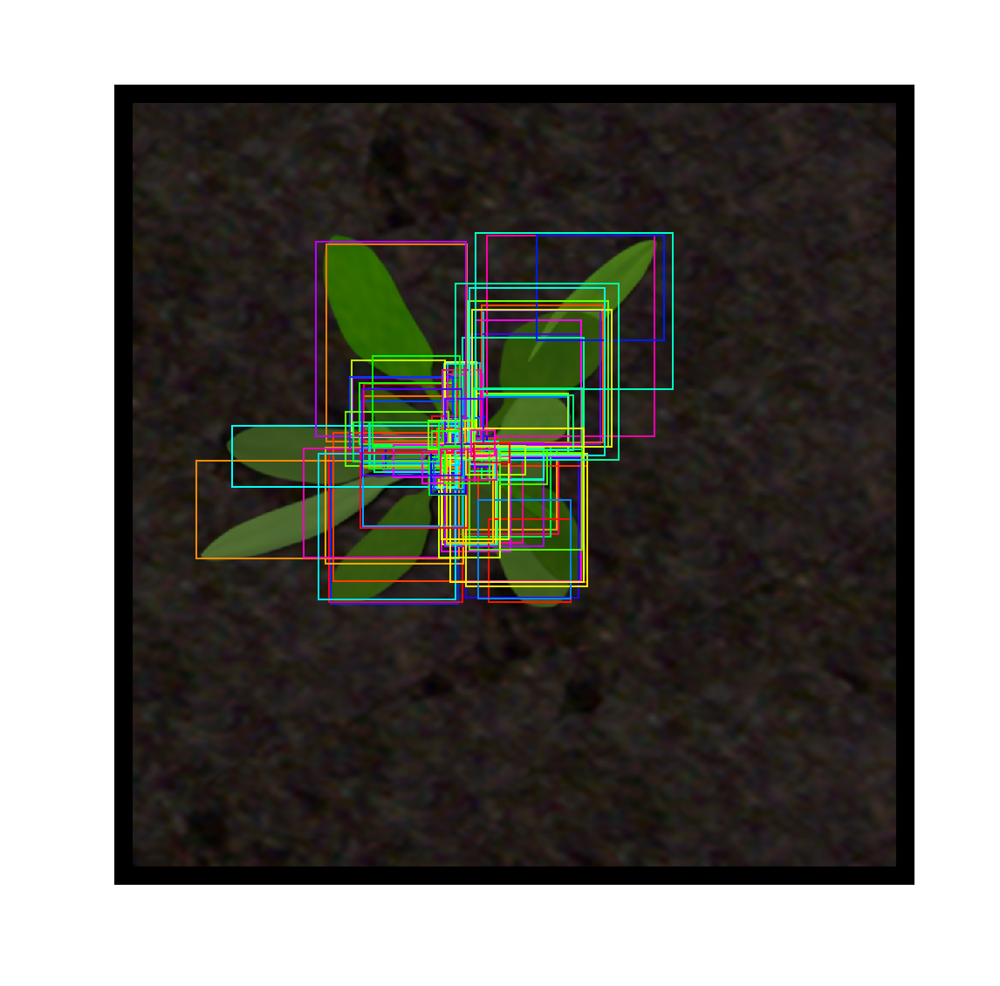

In [72]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 100
# Convert back to image coordinates for display
# h, w = config.IMAGE_SHAPE[:2]
# proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(
    image, ax=get_ax(),
    refined_boxes=utils.denorm_boxes(rpn['proposals'][0, :limit], image.shape[:2]))

# Stage 2: Proposal Classification
This stage takes the region proposals from the RPN and classifies them 
## 2.a Proposal Classification 
Run the classifier heads on proposals to generate class probabilities and bounding box regressions 

In [26]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([molded_image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
], [image_meta])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 2)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 2, 4)       min:   -3.00811  max:    3.67196  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00000  max:    0.99997  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32


23 detections: ['leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves'
 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves'
 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves']


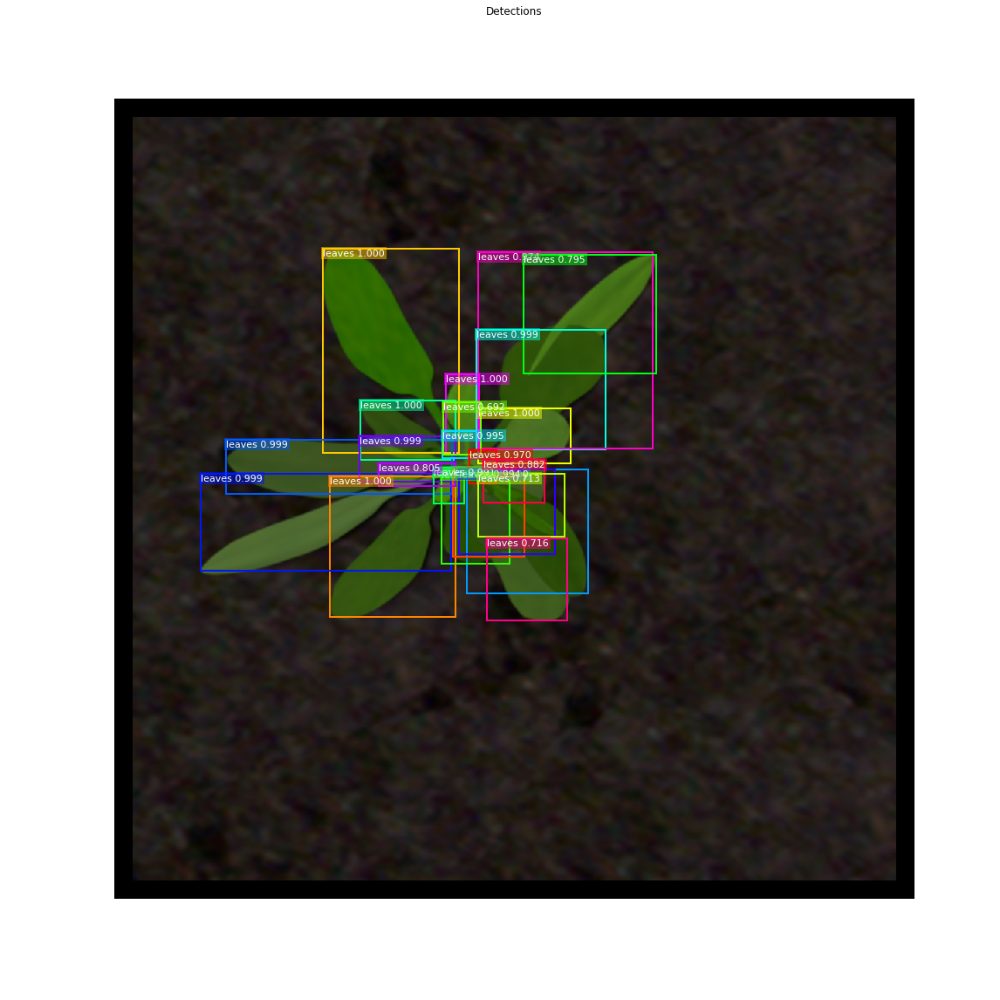

In [29]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    molded_image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], molded_image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

## 2.c Step by Step Detection 
Here we dive deeper into the process of processing the detections 

In [30]:
# Proposals are in normalized coordinates
proposals = mrcnn["proposals"][0]

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1000 Valid proposals out of 1000
265 Positive ROIs
[('BG', 735), ('leaves', 265)]


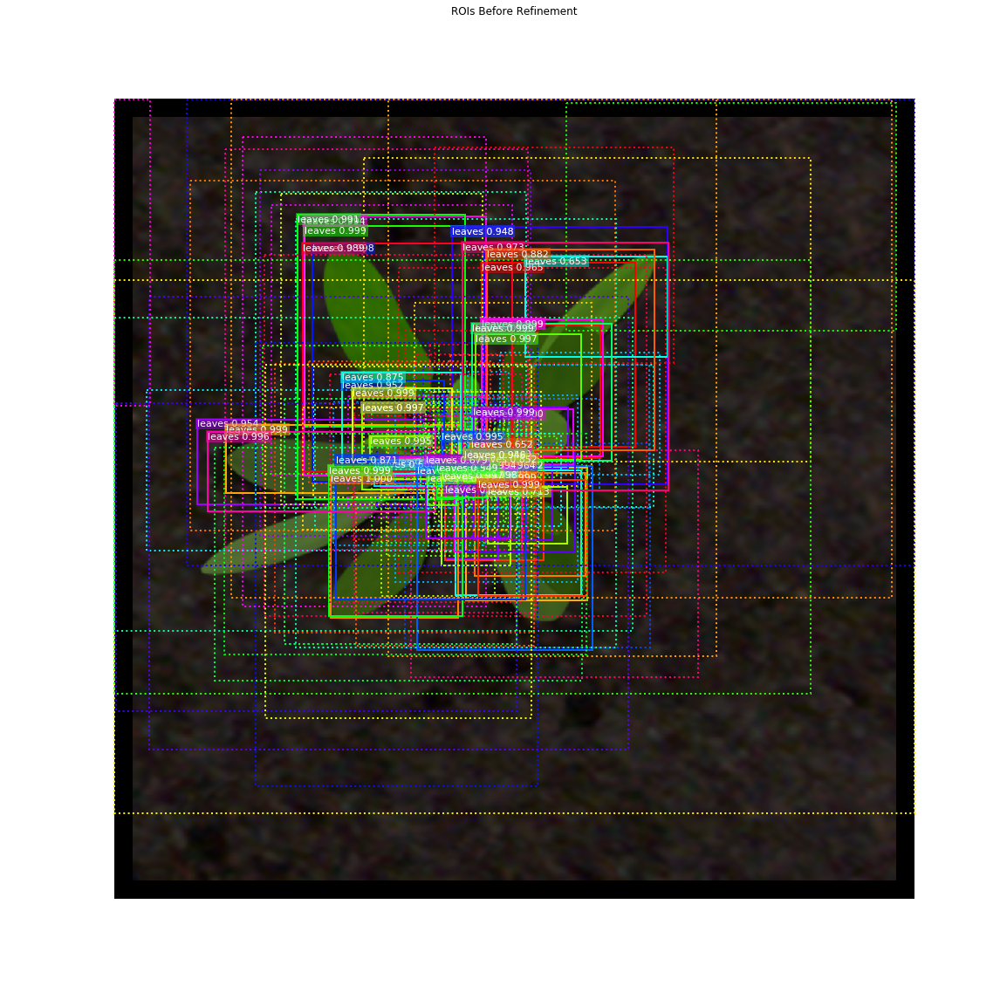

In [31]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(
    molded_image,
    boxes=utils.denorm_boxes(proposals[ixs], molded_image.shape[:2]),
    visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
    captions=captions, title="ROIs Before Refinement",
    ax=get_ax())

## Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -2.75944  max:    3.67196  float32
refined_proposals        shape: (1000, 4)             min:   -0.28787  max:    1.11323  float32


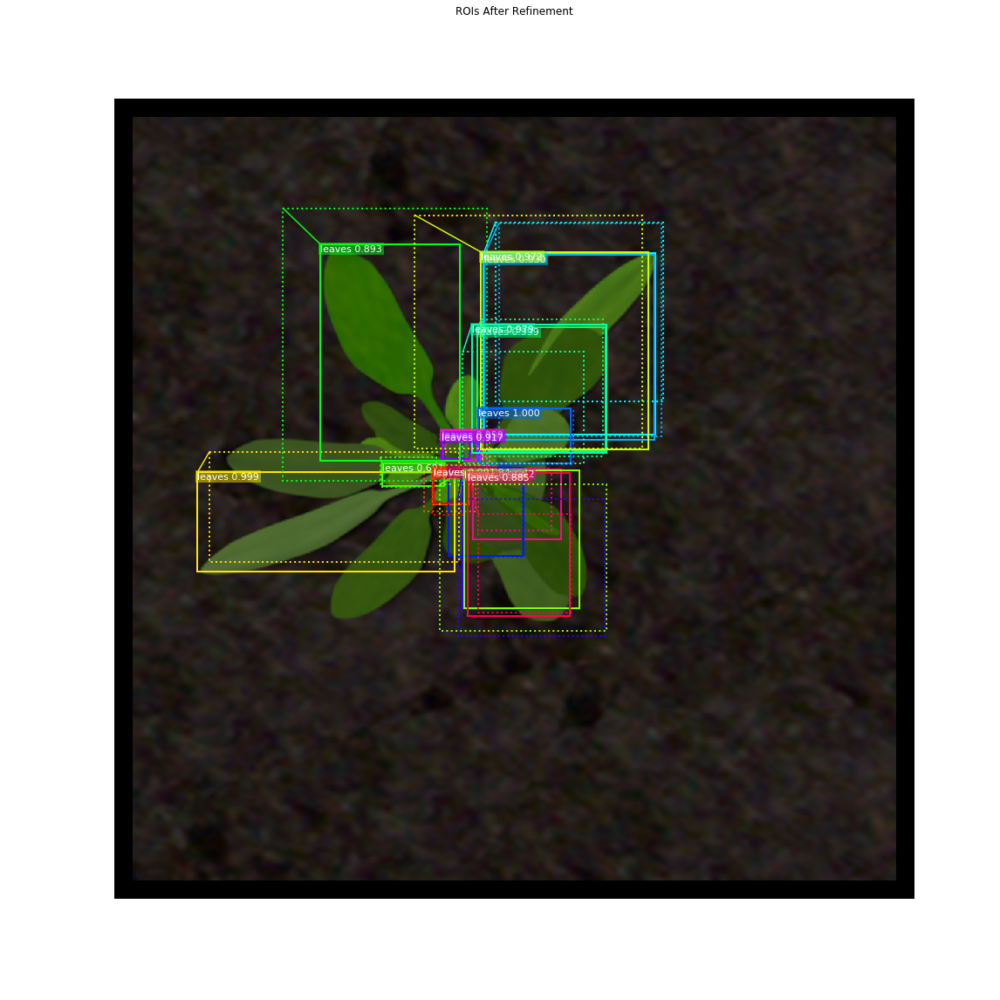

In [33]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 20
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(
    molded_image, ax=get_ax(),
    boxes=utils.denorm_boxes(proposals[roi_positive_ixs][ids], molded_image.shape[:2]),
    refined_boxes=utils.denorm_boxes(refined_proposals[roi_positive_ixs][ids], molded_image.shape[:2]),
    visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
    captions=captions, title="ROIs After Refinement")

## Filter Low Confidence Detections 

In [34]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > config.DETECTION_MIN_CONFIDENCE)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 265 detections:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  59  60  61  62  63  64  65  66  67  68  70  71  72  73
  74  75  76  77  78  79  80  81  82  84  85  86  87  88  90  91  92  98
 100 101 103 104 106 107 108 109 110 111 112 113 114 115 116 117 118 119
 120 121 122 124 126 127 128 129 131 132 133 134 135 136 137 138 139 141
 142 143 144 145 147 149 150 151 152 153 154 157 159 161 162 164 165 166
 168 170 171 172 175 177 178 179 181 182 183 184 185 186 188 190 191 194
 197 198 201 202 203 205 206 211 212 213 219 221 222 229 230 231 237 238
 240 241 242 251 260 263 265 269 275 283 310 316 317 318 321 322 327 329
 330 332 337 341 345 346 347 356 360 363 364 367 368 369 372 385 387 388
 403 404 409 411 412 415 418 419 426 433 436 444 453 460 463 465 466 467
 507 510 514 524 529 544 554 5

In [35]:
print(config.DETECTION_MIN_CONFIDENCE)

0.6


In [41]:
print(len(np.where(roi_scores >= 0)))

1


In [36]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.6 confidence. Keep 252:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  59  60  61  62  63  64  65  66  67  68  70  71  72  73  74
  75  76  77  78  79  80  81  82  84  85  86  87  88  90  91  92  98 100
 101 103 104 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120
 121 122 124 126 127 128 129 131 132 133 134 135 136 137 138 139 141 142
 143 144 145 147 149 150 151 152 153 154 157 159 161 162 164 165 166 168
 170 172 175 177 178 181 182 183 184 185 186 188 190 191 194 197 198 201
 202 203 205 206 211 212 213 219 221 222 230 231 237 238 240 241 242 251
 260 269 275 283 310 316 317 318 321 322 329 330 332 337 341 345 346 347
 356 360 363 364 367 368 369 372 385 387 388 403 404 409 411 412 415 418
 419 426 433 436 444 460 463 465 467 507 510 514 524 529 544 554 556 586
 598 5

In [26]:
print(config.DETECTION_NMS_THRESHOLD)

0.64


## Per-Class Non-Max Suppression 

In [37]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            0.5)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

leaves                : [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  59  60  61  62  63  64  65  66  67  68  70  71  72  73  74
  75  76  77  78  79  80  81  82  84  85  86  87  88  90  91  92  98 100
 101 103 104 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120
 121 122 124 126 127 128 129 131 132 133 134 135 136 137 138 139 141 142
 143 144 145 147 149 150 151 152 153 154 157 159 161 162 164 165 166 168
 170 172 175 177 178 181 182 183 184 185 186 188 190 191 194 197 198 201
 202 203 205 206 211 212 213 219 221 222 230 231 237 238 240 241 242 251
 260 269 275 283 310 316 317 318 321 322 329 330 332 337 341 345 346 347
 356 360 363 364 367 368 369 372 385 387 388 403 404 409 411 412 415 418
 419 426 433 436 444 460 463 465 467 507 510 514 524 529 544 554 556 586
 598 599 615 617 646 659 68

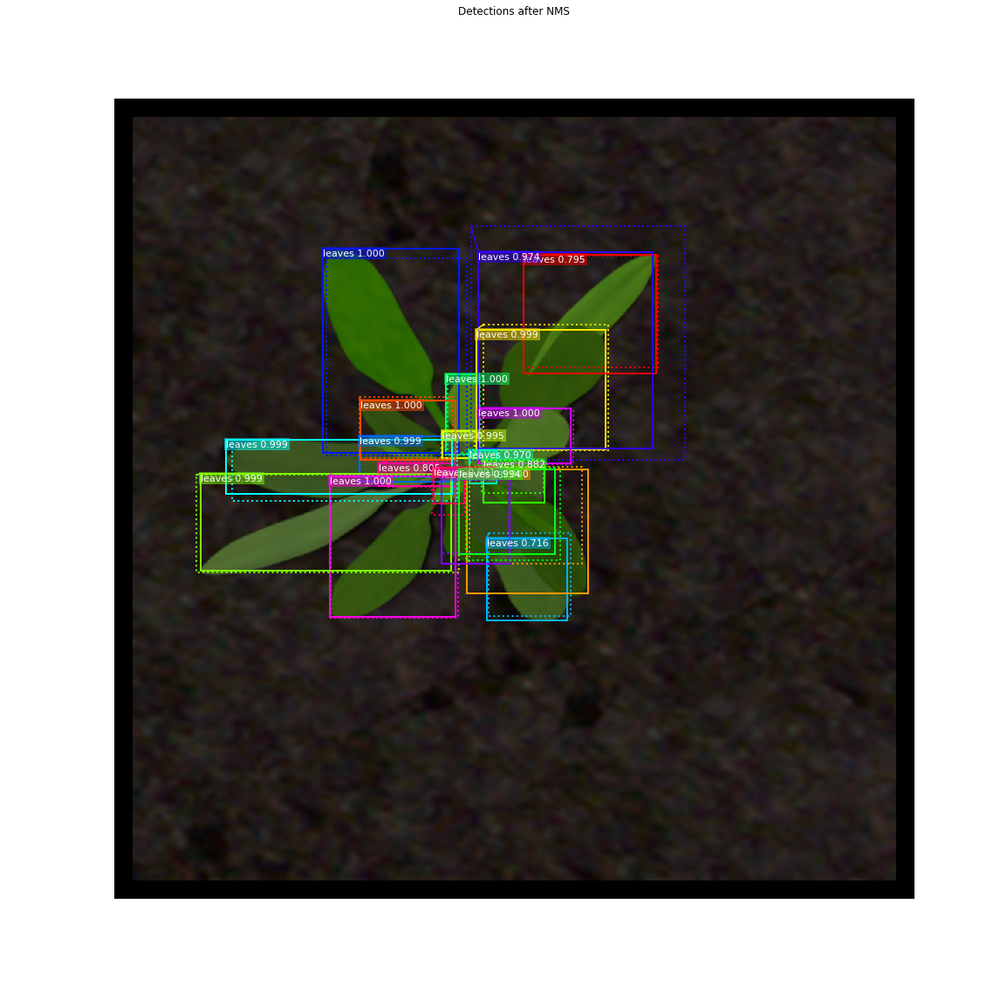

In [39]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    molded_image,
    boxes=utils.denorm_boxes(proposals[keep][ixs], molded_image.shape[:2]),
    refined_boxes=utils.denorm_boxes(refined_proposals[keep][ixs], molded_image.shape[:2]),
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

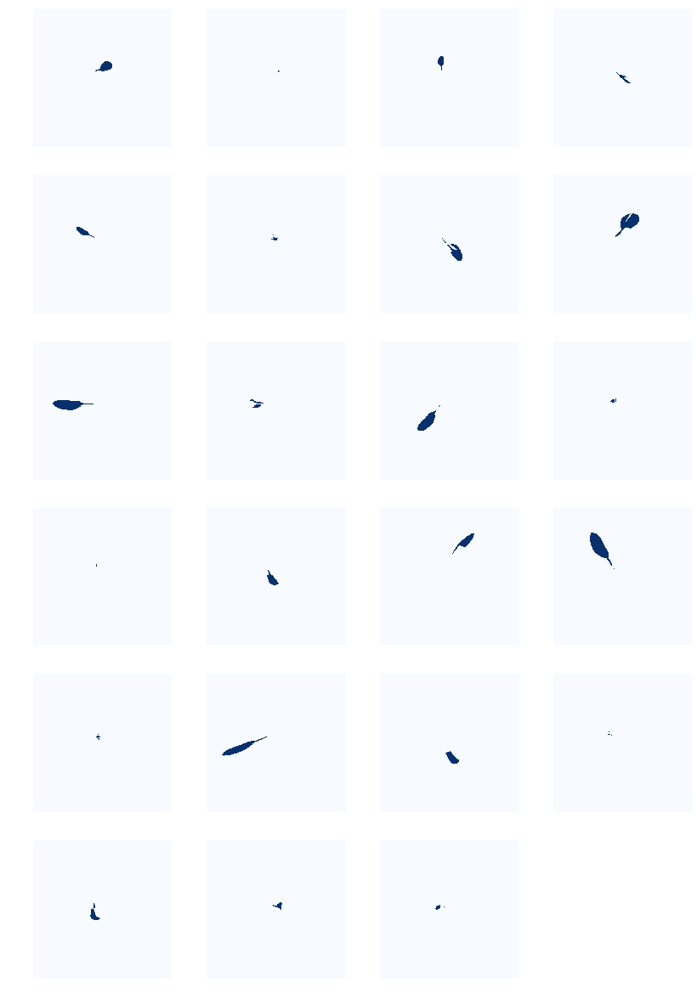

In [41]:
limit = 27
display_images(np.transpose(molded_gt_mask[..., :limit], [2, 0, 1]), cmap="Blues")

In [96]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00000  max:    0.99998  float32
20 detections: ['leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves'
 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves'
 'leaves' 'leaves' 'leaves' 'leaves']


In [99]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00000  max:    0.99998  float32
20 detections: ['leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves'
 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves' 'leaves'
 'leaves' 'leaves' 'leaves' 'leaves']


In [24]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (17, 28, 28)          min:    0.00000  max:    0.99997  float32
det_masks                shape: (17, 1152, 1152)      min:    0.00000  max:    1.00000  bool


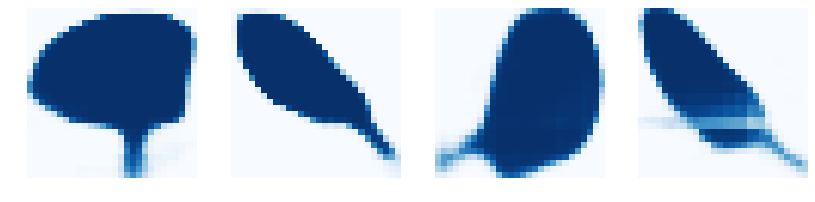

In [89]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

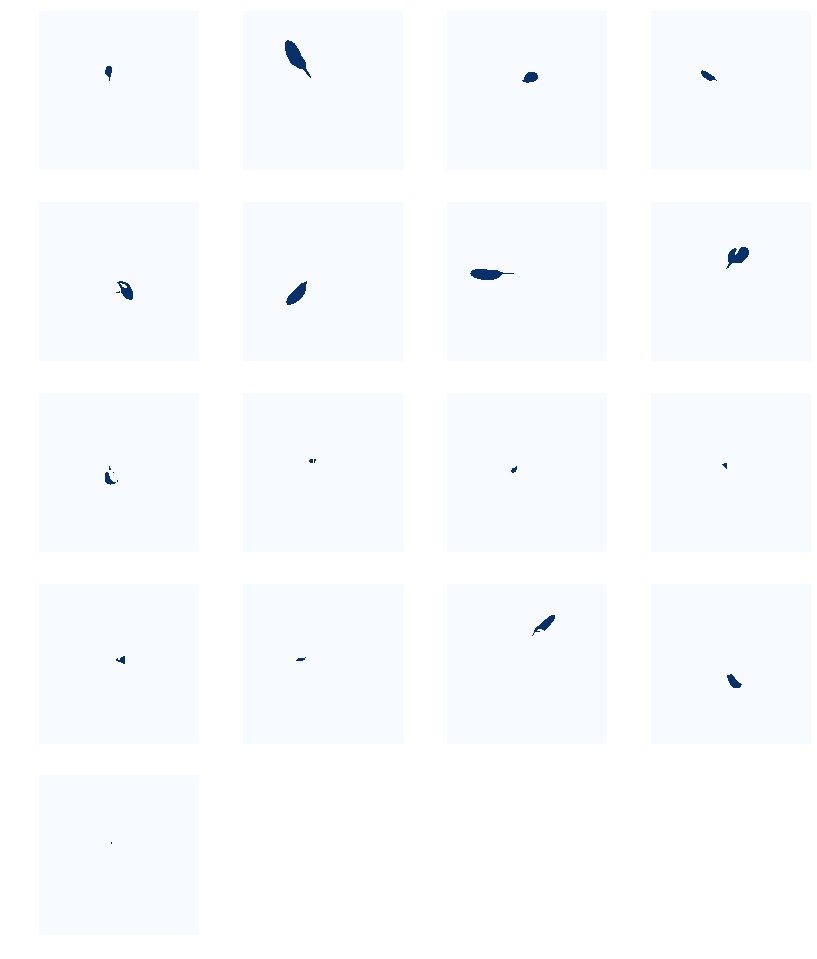

In [25]:
display_images(det_masks[:17] * 255, cmap="Blues", interpolation="none")

In [91]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 2304, 2304, 3)    min: -123.70000  max:   25.20000  float32
res2c_out                shape: (1, 576, 576, 256)    min:    0.00000  max:   27.49158  float32
res3c_out                shape: (1, 288, 288, 512)    min:    0.00000  max:   18.95683  float32
rpn_bbox                 shape: (1, 1325808, 4)       min:  -17.80614  max:   90.89989  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    0.79773  float32


In [88]:
# Backbone feature map
display_images(np.transpose(activations["res2c_out"][0,:,:,:4], [2, 0, 1]), cols=4)

NameError: name 'activations' is not defined